# References

- https://www.sciencedirect.com/science/article/pii/S1110016811000421#!
- https://salman-h-khan.github.io/papers/TPAMI15.pdf
- https://link.springer.com/chapter/10.1007/978-3-319-21978-3_52
- https://ieeexplore.ieee.org/abstract/document/5196726/metrics#metrics
- https://www.sciencedirect.com/science/article/pii/S2214241X15001789

- https://ieeexplore.ieee.org/document/7009877?reload=true&arnumber=7009877

# Parameters

In [1]:
REGION_NAMES = ['GRASS', 'SIDEWALK', 'BUILDING', 'GRAVEL']

# don't change
REFERENCE_MISSION = 2

# Imports and Functions

In [2]:
import copy
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
from skimage import exposure
from skimage.morphology import area_opening, disk
import sys

In [3]:
def plot_images(image_list, title_list=[], grid='off'):
    fig, axes = plt.subplots(nrows=1, ncols=len(image_list), figsize=(10*len(image_list), 10*1))
    if len(image_list) == 1:
        axes = [axes]

    for i, ax in enumerate(axes):
        ax.imshow(cv2.cvtColor(image_list[i], cv2.COLOR_BGR2RGB))
        if len(title_list) > 0:
            ax.set_title(title_list[i])
        ax.axis(grid)

In [4]:
def plot_mission_region_sample_images(mission_numbers, mission_images=[], region_images=[], sample_images=[], display_missions=True, display_regions=True, display_samples=True):
    if display_missions:
        if len(mission_images) > 0:
            print('Displaying missions')
            plot_images(mission_images, ['Mission ' + str(mission_number) for mission_number in mission_numbers])
        else:
            print('[Error] No mission images available to display')
    
    if display_regions:
        if len(region_images) > 0:
            print('Displaying regions')
            plot_images(region_images, ['Region ' + str(mission_number) for mission_number in mission_numbers])
        else:
            print('[Error] No region images available to display')
    
    if display_samples:
        if len(sample_images) > 0:
            print('Displaying samples')
            plot_images(sample_images, ['Sample ' + str(mission_number) for mission_number in mission_numbers])
        else:
            print('[Error] No sample images available to display')

In [5]:
def get_mission_file_path(mission_number):
    return '..\\missions\\mission_' + str(mission_number) + '\\mission_' + str(mission_number) + '_'

In [6]:
def get_global_image(mission_number, get_normalized=True):
    if get_normalized:
        mission = np.load(get_mission_file_path(mission_number) + 'normalized_image.npy')
    else:
        mission = np.load(get_mission_file_path(mission_number) + 'aligned_image.npy')
    
    return mission

In [7]:
def get_region_and_sample_image(mission_number, region_name, get_normalized=True):
    if get_normalized:
        region = np.load(get_mission_file_path(mission_number) + 'normalized_region_image_' + region_name + '.npy')
        sample = np.load(get_mission_file_path(mission_number) + 'normalized_sample_image_' + region_name + '.npy')
    else:
        region = np.load(get_mission_file_path(mission_number) + 'aligned_region_image_' + region_name + '.npy')
        sample = np.load(get_mission_file_path(mission_number) + 'aligned_sample_image_' + region_name + '.npy')
    
    return region, sample

# Start

In [8]:
mission_numbers = [REFERENCE_MISSION, 3, 4, 5, 6, 8, 9, 10, 11]
region_type = 'GRASS'
get_normalized = False

In [9]:
mission_images = []
region_images = []
sample_images = []

for mission_number in mission_numbers:
    if not os.path.isdir('..\\missions\\mission_' + str(mission_number)):
        print('[Error] Mission %d directory has not been created' % (mission_number))
        break
    
    mission_image = get_global_image(mission_number, get_normalized)
    mission_images.append(mission_image)
    
    region_image, sample_image = get_region_and_sample_image(mission_number, region_type, get_normalized)
    region_images.append(region_image)
    sample_images.append(sample_image)
    
# all lengths and dimensions should match
print(mission_images[0].shape)
print(region_images[0].shape)
print(sample_images[0].shape)
print(len(mission_images))
print(len(region_images))
print(len(sample_images))

(543, 470, 3)
(543, 470, 3)
(543, 470, 3)
9
9
9


# Missions, Regions, Samples in BGR

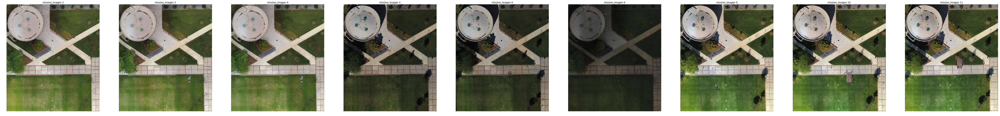

In [13]:
plot_images(mission_images, ['mission_images ' + str(mission_number) for mission_number in mission_numbers])
# plot_images(region_images, ['region_images ' + str(mission_number) for mission_number in mission_numbers])
# plot_images(sample_images, ['sample_images ' + str(mission_number) for mission_number in mission_numbers])

In [11]:
histogram_mission_images = []
histogram_mission_images_hsv = []

for mission_number in mission_numbers:
    histogram_mission_images.append(np.load(get_mission_file_path(mission_number) + 'histogram_matched_image' + '.npy'))
    histogram_mission_images_hsv.append(np.load(get_mission_file_path(mission_number) + 'histogram_matched_image_hsv' + '.npy'))

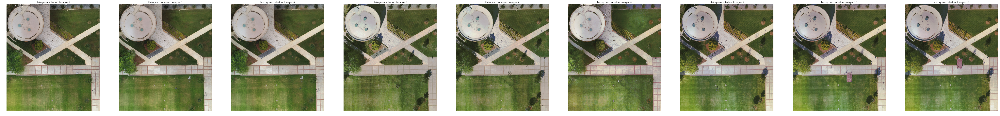

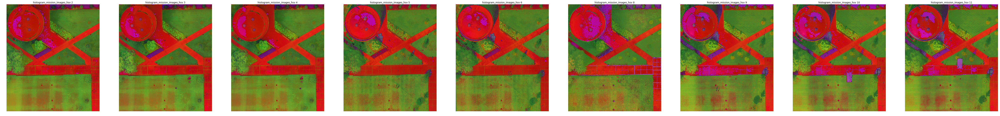

In [12]:
plot_images(histogram_mission_images, ['histogram_mission_images ' + str(mission_number) for mission_number in mission_numbers])
plot_images(histogram_mission_images_hsv, ['histogram_mission_images_hsv ' + str(mission_number) for mission_number in mission_numbers])

In [62]:
ideal_brown_lower = (50, 60, 95)
ideal_brown_upper = (60, 80, 105)

l_b = np.zeros((25, 25, 3)).astype(np.uint8)
l_b[:, :, 0] = ideal_brown_lower[0]
l_b[:, :, 1] = ideal_brown_lower[1]
l_b[:, :, 2] = ideal_brown_lower[2]

u_b = np.zeros((25, 25, 3)).astype(np.uint8)
u_b[:, :, 0] = ideal_brown_upper[0]
u_b[:, :, 1] = ideal_brown_upper[1]
u_b[:, :, 2] = ideal_brown_upper[2]

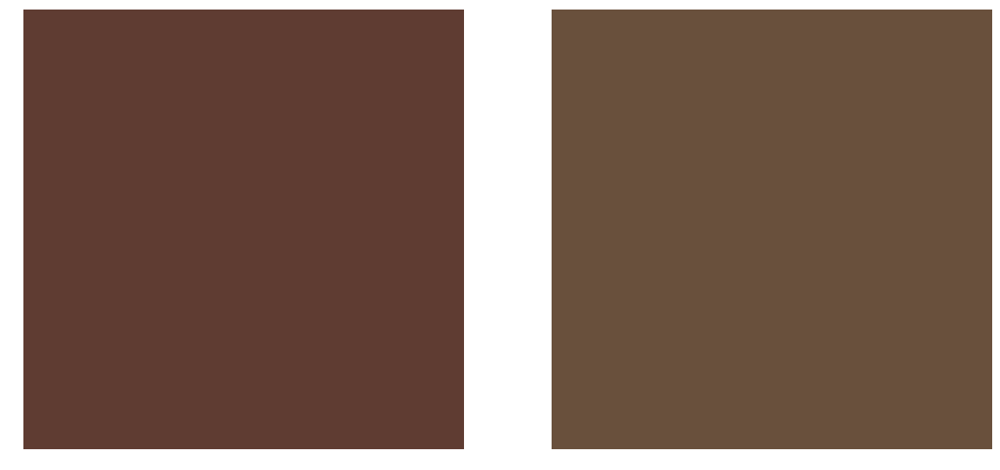

In [63]:
plot_images([l_b, u_b])

In [60]:
# ideal_green_lower = (35, 65, 50)
# ideal_green_upper = (40, 85, 65)

ideal_green_lower = (35, 65, 50)
ideal_green_upper = (40, 85, 65)

l_g = np.zeros((25, 25, 3)).astype(np.uint8)
l_g[:, :, 0] = ideal_green_lower[0]
l_g[:, :, 1] = ideal_green_lower[1]
l_g[:, :, 2] = ideal_green_lower[2]

u_g = np.zeros((25, 25, 3)).astype(np.uint8)
u_g[:, :, 0] = ideal_green_upper[0]
u_g[:, :, 1] = ideal_green_upper[1]
u_g[:, :, 2] = ideal_green_upper[2]

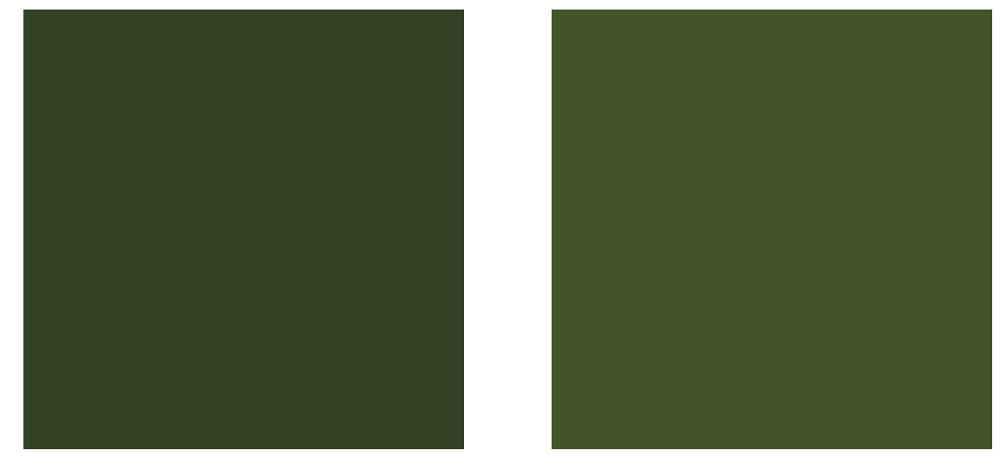

In [61]:
plot_images([l_g, u_g])

In [106]:
masks = []
images = []

for i in range(0, len(mission_numbers)):
    mask = cv2.inRange(histogram_mission_images[i], ideal_green_lower, ideal_green_upper)
    masks.append(mask)
    images.append(cv2.bitwise_and(histogram_mission_images[i], histogram_mission_images[i], mask=mask))
    
    print(np.sum(mask != 0))# / np.prod(mask.shape) * 100)

11701
10528
11753
12896
11297
15960
13254
11813
12610


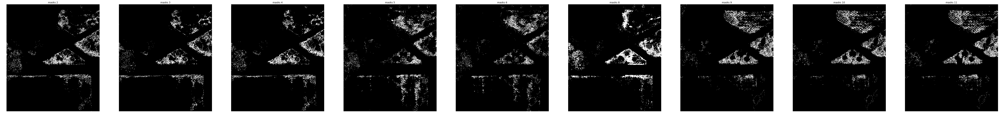

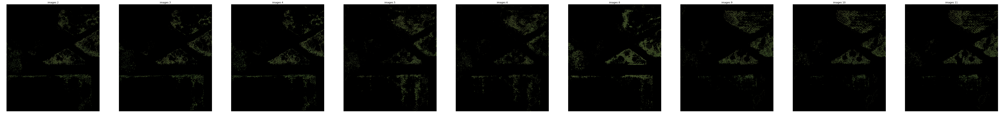

In [65]:
plot_images(masks, ['masks ' + str(mission_number) for mission_number in mission_numbers])
plot_images(images, ['images ' + str(mission_number) for mission_number in mission_numbers])

#242518
#a4ab6d


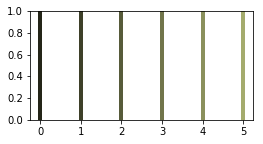

In [129]:
# color gradient from dark brown to dark green

from PIL import ImageColor

c1 = '#%02x%02x%02x' % (36, 37, 24) #bgr to rgb
c2 = '#%02x%02x%02x' % (164, 171, 109)
# c1 = '#00FF00' # RGB green
# c2 = '#FF0000' # RGB red
print(c1)
print(c2)

import matplotlib as mpl

def colorFader(c1,c2,mix=0): #fade (linear interpolate) from color c1 (at mix=0) to c2 (mix=1)
    c1=np.array(mpl.colors.to_rgb(c1))
    c2=np.array(mpl.colors.to_rgb(c2))
    return mpl.colors.to_hex((1-mix)*c1 + mix*c2)

n=5

buckets = [(0, 0, 0)]
# color_buckets = []
fig, ax = plt.subplots(figsize=(4, 2))
for x in range(n+1):
    X = colorFader(c1,c2,x/n)
    ax.axvline(x, color=X, linewidth=4)
    
#     color_buckets.append(ImageColor.getcolor(X, "RGB")[::-1])
    buckets.append(ImageColor.getcolor(X, "RGB")[::-1])
plt.show()

In [130]:
buckets.append((255, 255, 255))
print(buckets)
print(color_buckets)

[(0, 0, 0), (24, 37, 36), (41, 64, 62), (58, 91, 87), (75, 117, 113), (92, 144, 138), (109, 171, 164), (255, 255, 255)]
[(0, 255, 0), (0, 230, 26), (0, 204, 51), (0, 178, 76), (0, 153, 102), (0, 128, 128), (0, 102, 153), (0, 77, 178), (0, 51, 204), (0, 25, 230), (0, 0, 255)]


In [131]:
masks = []
images = []

for i in range(0, 1):#len(mission_numbers)):
    for j in range(0, len(buckets)-1):
        print(buckets[j], buckets[j+1])
        mask = cv2.inRange(histogram_mission_images[i], buckets[j], buckets[j+1])
        print(np.sum(mask != 0))
        masks.append(mask)
        images.append(cv2.bitwise_and(histogram_mission_images[i], histogram_mission_images[i], mask=mask))

(0, 0, 0) (24, 37, 36)
1254
(24, 37, 36) (41, 64, 62)
18747
(41, 64, 62) (58, 91, 87)
20616
(58, 91, 87) (75, 117, 113)
3919
(75, 117, 113) (92, 144, 138)
5547
(92, 144, 138) (109, 171, 164)
1425
(109, 171, 164) (255, 255, 255)
56015


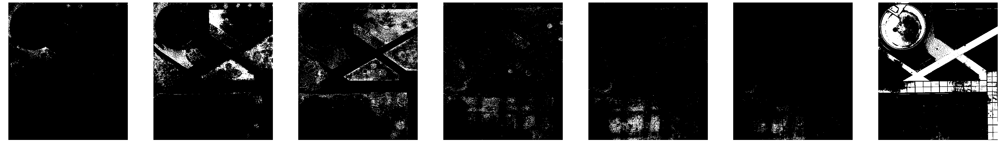

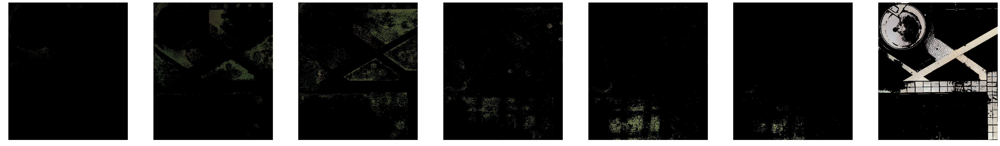

In [132]:
plot_images(masks)
plot_images(images)

In [19]:
i = 0

sample_mask = sample_images[i] != [0, 0, 0]
sample_mask = sample_mask.astype(np.uint8)*255
sample_mask = sample_mask[:, :, 0]
sample_mask_bool = np.bool_(sample_mask)

In [20]:
pixel_mean = [np.mean(sample_images[i][sample_mask_bool, 0]), np.mean(sample_images[i][sample_mask_bool, 1]), np.mean(sample_images[i][sample_mask_bool, 2])]
print(pixel_mean)

pixel_variance = [np.var(sample_images[i][sample_mask_bool, 0]), np.var(sample_images[i][sample_mask_bool, 1]), np.var(sample_images[i][sample_mask_bool, 2])]
print(pixel_variance)

[35.48632218844985, 90.66261398176292, 64.33434650455926]
[22.334919300449922, 32.21139863822396, 32.939884147411796]


In [21]:
region_mask = region_images[i] != [0, 0, 0]
region_mask = region_mask.astype(np.uint8)*255
region_mask = region_mask[:, :, 0]
region_mask_bool = np.bool_(region_mask)

In [43]:
H, W = region_mask.shape

heatmap = np.zeros((H, W, 3)).astype(np.int16)

heatmap[region_mask_bool, :] = region_images[i][region_mask_bool, :] - pixel_mean
heatmap[region_mask_bool, :] = heatmap[region_mask_bool, :] / pixel_variance
print(np.min(heatmap), np.max(heatmap))

# heatmap[region_mask_bool, :] = heatmap[region_mask_bool, :] - np.min(heatmap)
# print(np.min(heatmap), np.max(heatmap))
# scale = 255/np.max(heatmap)
# heatmap[region_mask_bool, :] = heatmap[region_mask_bool, :]*scale
# print(np.min(heatmap), np.max(heatmap))


heatmap = heatmap.astype(np.uint8)
heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2GRAY)
print(np.min(heatmap), np.max(heatmap))

-1 8
0 226


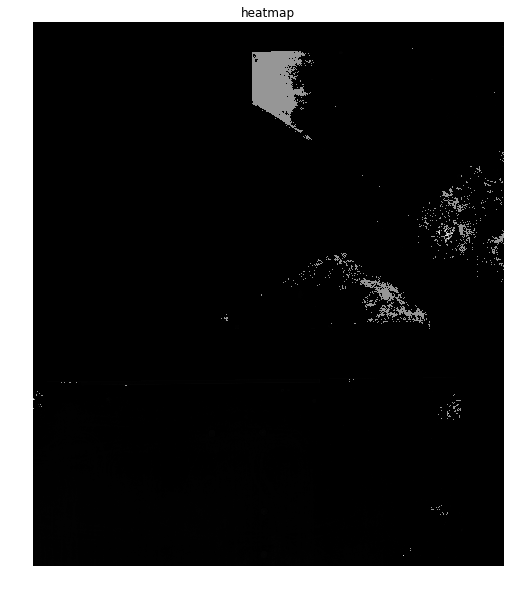

In [44]:
plot_images([heatmap], ['heatmap'])

In [38]:
heat = np.zeros((H, W, 3)).astype(np.uint8)
mask = heatmap == -1
print(mask.shape)

# result = np.where(heatmap == -1)
# coordinates = list(zip(result[0], result[1]))
# print(len(coordinates))

(543, 470, 3)
